In [3]:
from ultralytics import YOLO
from deepsparse import Pipeline

from PIL import Image, ImageFont, ImageDraw

In [2]:
classes = {
    "0": "person",
    "1": "bicycle",
    "2": "car",
    "3": "motorcycle",
    "4": "airplane",
    "5": "bus",
    "6": "train",
    "7": "truck",
    "8": "boat",
    "9": "traffic light",
    "10": "fire hydrant",
    "11": "stop sign",
    "12": "parking meter",
    "13": "bench",
    "14": "bird",
    "15": "cat",
    "16": "dog",
    "17": "horse",
    "18": "sheep",
    "19": "cow",
    "20": "elephant",
    "21": "bear",
    "22": "zebra",
    "23": "giraffe",
    "24": "backpack",
    "25": "umbrella",
    "26": "handbag",
    "27": "tie",
    "28": "suitcase",
    "29": "frisbee",
    "30": "skis",
    "31": "snowboard",
    "32": "sports ball",
    "33": "kite",
    "34": "baseball bat",
    "35": "baseball glove",
    "36": "skateboard",
    "37": "surfboard",
    "38": "tennis racket",
    "39": "bottle",
    "40": "wine glass",
    "41": "cup",
    "42": "fork",
    "43": "knife",
    "44": "spoon",
    "45": "bowl",
    "46": "banana",
    "47": "apple",
    "48": "sandwich",
    "49": "orange",
    "50": "broccoli",
    "51": "carrot",
    "52": "hot dog",
    "53": "pizza",
    "54": "donut",
    "55": "cake",
    "56": "chair",
    "57": "couch",
    "58": "potted plant",
    "59": "bed",
    "60": "dining table",
    "61": "toilet",
    "62": "tv",
    "63": "laptop",
    "64": "mouse",
    "65": "remote",
    "66": "keyboard",
    "67": "cell phone",
    "68": "microwave",
    "69": "oven",
    "70": "toaster",
    "71": "sink",
    "72": "refrigerator",
    "73": "book",
    "74": "clock",
    "75": "vase",
    "76": "scissors",
    "77": "teddy bear",
    "78": "hair drier",
    "79": "toothbrush"
}

In [3]:
# Specify the path to your YOLO11 ONNX model
model_path = "yolo11n.onnx"

# Set up the DeepSparse Pipeline
yolo_pipeline = Pipeline.create(task="yolov8", model_path=model_path)



2025-01-20 21:39:47 deepsparse.pipeline WARNING  Could not create v2 'yolov8' pipeline, trying legacy
DeepSparse, Copyright 2021-present / Neuralmagic, Inc. version: 1.8.0 COMMUNITY | (e3778e93) (release) (optimized) (system=avx2, binary=avx2)


In [7]:
%%timeit

# Run the model on your images
image = "data/test/IMG_4334.JPG"
pil_image = Image.open(image)
pipeline_outputs = yolo_pipeline(images=[image])

622 ms ± 21.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [8]:
pipeline_outputs

YOLOOutput(boxes=[[[157.2028610229492, 1571.8285388946533, 952.1204727172851, 1937.0203685760498], [1147.0421997070312, 1187.843630218506, 1877.1112243652344, 2244.3210708618167], [1.530347442626953, 1166.8988651275636, 421.2085350036621, 1983.7951000213625], [2832.2379821777345, 895.9381467819214, 3384.6438537597655, 1750.8384183883668], [807.1250152587891, 1442.3810874938965, 1227.8803436279297, 1773.0198406219483], [301.2514102935791, 1230.8950881958008, 854.6859008789062, 1785.1283740997314], [888.821987915039, 1118.0340911865235, 1317.0397247314452, 1652.1562065124513], [1891.8360900878906, 1202.2334095001222, 2368.0963256835935, 1786.3926086425781], [823.7967132568359, 1122.5811178207398, 1031.2029876708984, 1298.7022916793824], [2451.296969604492, 1156.171148300171, 2819.240963745117, 1560.983374786377], [1283.2249053955077, 1358.8252418518066, 1531.094760131836, 1571.1863639831545], [1896.1179290771483, 1938.675661468506, 2197.7665740966795, 2100.8325050354006], [1775.096520996

In [9]:
from typing import Tuple


def draw_rectangle(img: Image.Image, shape: Tuple[int, int, int, int], label: str) -> Image.Image:
    img1 = ImageDraw.Draw(img)
    img1.rectangle(shape, outline="green",width=10)
    img1.text((shape[0], shape[1]), label, font=ImageFont.truetype("data/Arial.ttf", size=40))
    return img

In [10]:
pipeline_outputs[0]

_YOLOImageOutput(boxes=[[157.2028610229492, 1571.8285388946533, 952.1204727172851, 1937.0203685760498], [1147.0421997070312, 1187.843630218506, 1877.1112243652344, 2244.3210708618167], [1.530347442626953, 1166.8988651275636, 421.2085350036621, 1983.7951000213625], [2832.2379821777345, 895.9381467819214, 3384.6438537597655, 1750.8384183883668], [807.1250152587891, 1442.3810874938965, 1227.8803436279297, 1773.0198406219483], [301.2514102935791, 1230.8950881958008, 854.6859008789062, 1785.1283740997314], [888.821987915039, 1118.0340911865235, 1317.0397247314452, 1652.1562065124513], [1891.8360900878906, 1202.2334095001222, 2368.0963256835935, 1786.3926086425781], [823.7967132568359, 1122.5811178207398, 1031.2029876708984, 1298.7022916793824], [2451.296969604492, 1156.171148300171, 2819.240963745117, 1560.983374786377], [1283.2249053955077, 1358.8252418518066, 1531.094760131836, 1571.1863639831545], [1896.1179290771483, 1938.675661468506, 2197.7665740966795, 2100.8325050354006], [1775.0965

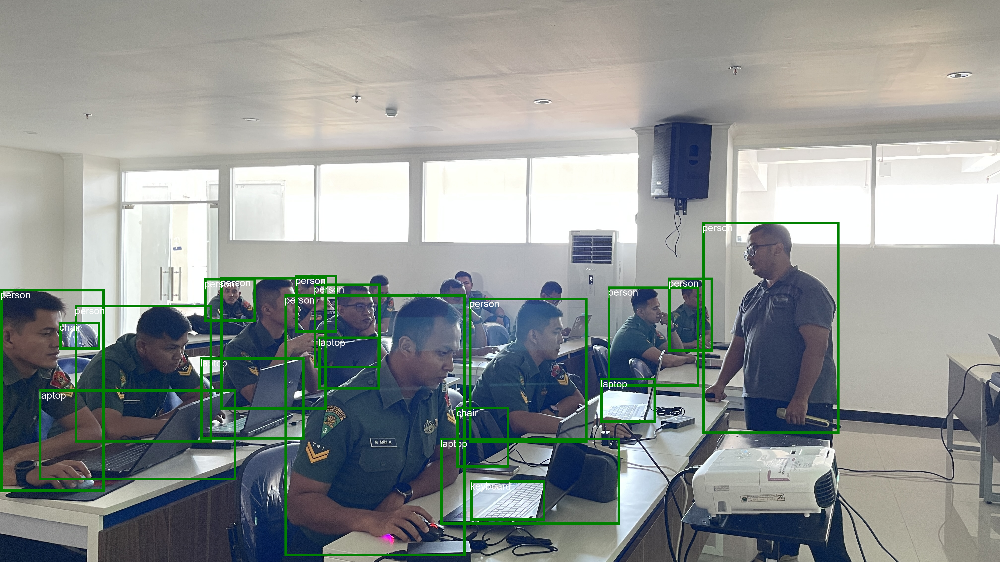

In [11]:


for k in range(len(pipeline_outputs[0].boxes)):
    bboxes = pipeline_outputs[0].boxes[k]
    label = int(pipeline_outputs[0].labels[k])
    
    class_label = classes[f"{label}"]
    # print(pipeline_outputs[0].boxes[k])
    
    pil_image = draw_rectangle(pil_image, tuple(bboxes), class_label)
    
pil_image
    

In [12]:
import os

In [13]:
test_path = "data/test"

In [14]:
files = os.listdir(test_path)
files = [os.path.join(test_path, file) for file in files]
files

['data/test/bus.jpg',
 'data/test/IMG_4334.JPG',
 'data/test/IMG_4350.JPG',
 'data/test/jasa-foto-keluarga.jpg',
 'data/test/WhatsApp Image 2024-08-27 at 23.24.29_1187ce43.jpg',
 'data/test/WIN_20240913_09_51_59.jpg']

In [15]:
%%timeit

# for file in files:
#     # pil_image = Image.open(file)
#     pipeline_outputs = yolo_pipeline(images=[os.path.join("data/test", file)])

yolo_pipeline(images=files)

3.33 s ± 199 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
